In [1]:
import geopandas as gpd
import pandas as pd
import json
import plotly.graph_objects as go
import urllib.request

from shapely.geometry import LineString, MultiLineString

In [2]:
df= pd.read_csv('data/O3_por_ageb.csv')

In [3]:
df.head()

,id,O3_anual_f
0,5171,37.820261
1,3337,37.820261
2,4280,37.671950
3,7494,37.671950
4,3024,37.820261


In [4]:
geodf= gpd.read_file('data/O3_ageb.shp')

In [5]:
geodf.head()

,id,O3_anual_f,geometry
0,16946,36.005067,POLYGON ((-98.96482026691865 19.21442578890746...
1,17354,36.005067,POLYGON ((-98.95156061567165 19.21442578890746...
2,4199,36.005067,POLYGON ((-98.95948159243605 19.21442578890746...
3,1621,36.005067,POLYGON ((-98.95795433499778 19.21442578890746...
4,29615,36.005067,POLYGON ((-98.95999687941416 19.21442578890746...


In [6]:
geodf.to_file('data/o3_ageb.json', driver= 'GeoJSON')
with open ('data/o3_ageb.json') as geofile:
    j_file=json.load(geofile)

In [7]:
def check_geojson(j_file):
    if 'id' not in j_file['features'][0].keys():
        if 'properties' in j_file['features'][0].keys():
            if 'id' in j_file['features'][0]['properties'] and j_file['features'][0]['properties']['id'] is not None:
                for k, feat in enumerate(j_file['features']):
                    j_file['features'][k]['id']= feat['properties']['id']
            else:
                for k in range(len(j_file['features'])):
                    j_file['features'][k]['id']= k
    return j_file

In [8]:
jdata= check_geojson(j_file)

In [9]:
jdata['type']

'FeatureCollection'

In [10]:
jdata['features'][0].keys()

dict_keys(['type', 'properties', 'geometry', 'id'])

In [11]:
jdata['features'][7]['properties']

{'id': 7599, 'O3_anual_f': 36.005067}

In [18]:
geodf.O3_anual_f

0        36.005067
1        36.005067
2        36.005067
3        36.005067
4        36.005067
           ...    
13053    31.665856
13054    31.665856
13055    31.665856
13056    31.665856
13057    31.293028
Name: O3_anual_f, Length: 13058, dtype: float64

In [26]:
z= geodf.O3_anual_f.values.tolist()

In [27]:
trace = go.Choroplethmapbox(z=z,
                            locations=geodf.id,
                            colorscale='Viridis',
                            colorbar=dict(thickness=20, ticklen=3),
                            geojson=jdata,
                            hoverinfo= 'all',
                            marker_line_width=0.1, marker_opacity=0.5)

In [28]:
layout= go.Layout(title_text= 'Choroplethmapbox',
                   title_x=0.5, width = 700, height=700,
                   mapbox = dict(center= dict(lat=19.4284706,  lon=-99.1276627),
                                 style= 'carto-positron',
                                 zoom=11,
                               ))

In [29]:
fig= go.Figure(data=[trace], layout=layout)
fig.update_layout(mapbox_style= 'carto-positron')
fig.show()

In [16]:
geodf.loc[geodf['id'] == 21136]

,id,O3_anual_f,geometry
3894,21136,30.083696,POLYGON ((-99.12967805539408 19.43052784407674...


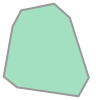

In [17]:
geodf.loc[geodf['id'] == 21136, 'geometry'].iloc[0]